# 1. 데이터셋 가져오기

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%ls '/content/drive/MyDrive/Project/Project_Datasets'

'bumble bee'/           'drain fly'/  'Leptoglossus occidentalis'/
'chinese grasshopper'/   housefly/


In [ ]:
import shutil

shutil.copytree("/content/drive/MyDrive/Project/Project_Datasets", "/content/datasets")

'/content/datasets'

In [ ]:
%cd /content/datasets/
%ls

/content/datasets
'bumble bee'/           'drain fly'/  'Leptoglossus occidentalis'/
'chinese grasshopper'/   housefly/


# 2. 데이터 전처리
## 2-1. 데이터 나누기 (Train, Valid, Test)

In [ ]:
!pip install split-folders

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import splitfolders

splitfolders.ratio("/content/datasets", output="/content/split", ratio=(.7, .1, .2))

Copying files: 1114 files [00:00, 3219.57 files/s]


## 2-2. 데이터 확인

In [ ]:
# 필요한 패키지와 모듈을 불러옴
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from keras.models import Sequential, Model
from keras.layers import Conv2D,Dense,Flatten,Dropout,MaxPooling2D, Input
from keras.optimizers import RMSprop
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import EarlyStopping
from keras.utils.vis_utils import plot_model

In [ ]:
image_height = 150   # 이미지 높이
image_width = 150    # 이미지 넓이
batch_size = 10      # batch size
no_of_epochs  = 50   # training 횟수
img_size = (150, 150, 3)

In [ ]:
# ImageDataGenerator 클래스를 통해 train_datagen 인스턴스를 만듭니다.
train_datagen = ImageDataGenerator( 
        rescale=1./255,         # 픽셀 값을 0~1 범위로 변환
        rotation_range=40,      # 40도까지 회전
        width_shift_range=0.2,  # 20%까지 좌우 이동
        height_shift_range=0.2, # 20%까지 상하 이동
        shear_range=0.2,        # 20%까지 기울임
        zoom_range=0.2,         # 20%까지 확대
        horizontal_flip=True,   # 좌우 뒤집기
    )

# train_datagen 인스턴스를 통해 train dataset 에서 한번에 batch_size 만큼 이미지를 만들어내는 train_generator 객체를 생성한다.
train_generator = train_datagen.flow_from_directory(
    '/content/split/train',
    batch_size=10,       # Size of the batches of data (default: 32).
    class_mode='categorical', # Determines the type of label arrays that are returned. "categorical" will be 2D one-hot encoded labels, "binary" will be 1D binary labels, "sparse" will be 1D integer labels
    target_size=(image_width, image_height)) # 이미지의 크기 재정의
 
# ImageDataGenerator를 통해 validation dataset 에서 한번에 batch_size 만큼 이미지를 만들어내는 test_generator 객체를 생성한다.
test_generator = ImageDataGenerator(rescale=1./255).flow_from_directory(
    '/content/split/val',
    batch_size=10,
    class_mode='categorical',
    target_size=(image_width, image_height))

# ImageDataGenerator를 통해 validation dataset 에서 한번에 batch_size 만큼 이미지를 만들어내는 pred_generator 객체를 생성한다.
pred_generator = ImageDataGenerator(rescale=1./255).flow_from_directory(
    '/content/split/val',
    batch_size=1,
    class_mode='categorical',
    target_size=(image_width, image_height))

Found 778 images belonging to 5 classes.
Found 110 images belonging to 5 classes.
Found 110 images belonging to 5 classes.


In [ ]:
print(train_generator.class_indices)

{'Leptoglossus occidentalis': 0, 'bumble bee': 1, 'chinese grasshopper': 2, 'drain fly': 3, 'housefly': 4}


In [ ]:
# label name 을 찾아 오는 함수를 정의한다.
def findKey(indices, search_value):
    for key, value in indices.items():
        if(value == search_value):
            return key
    return -1

# 2-3 데이터 시각화

Found 778 images belonging to 5 classes.


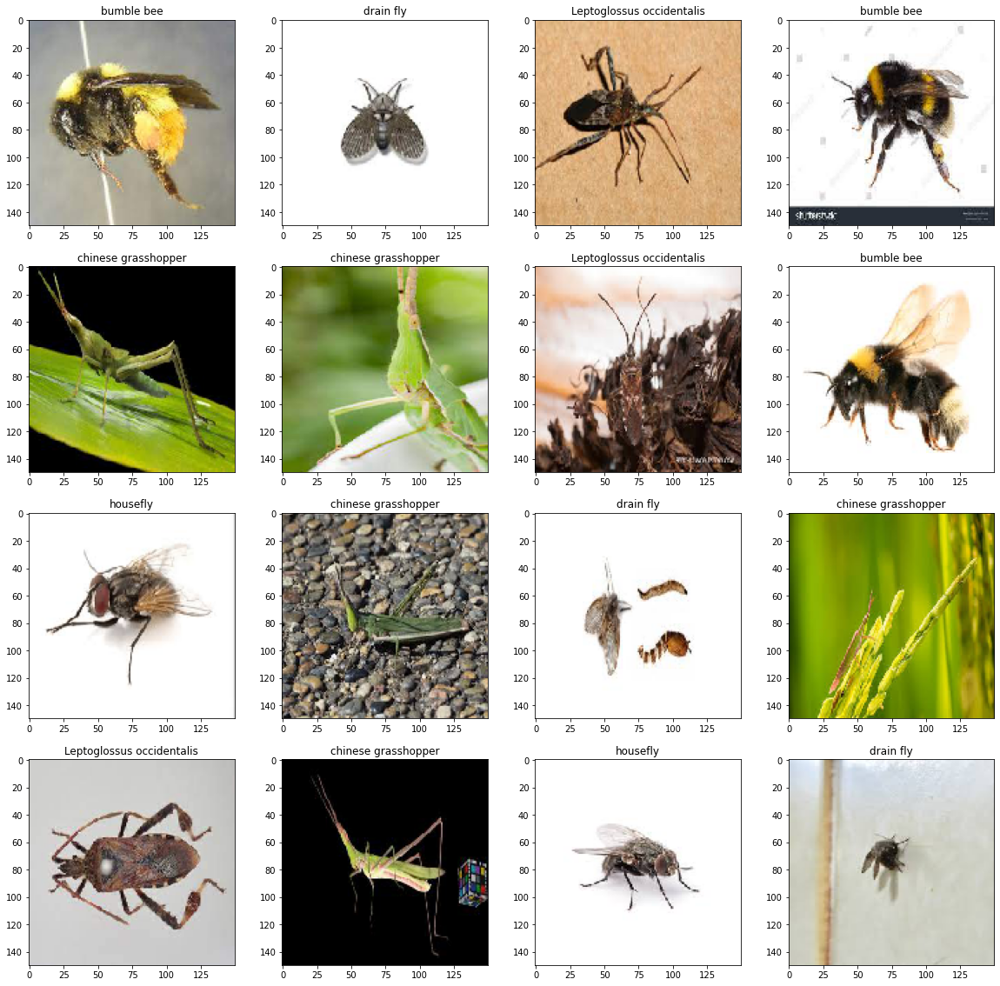

In [ ]:
# train dataset 에서 샘플 데이터를 display 해본다.
for X_batch, y_batch in ImageDataGenerator(rescale=1./255).flow_from_directory('/content/split/train',
                                                                                batch_size=16, class_mode='binary', target_size=(150, 150)):
    plt.figure(figsize=(20,20))
    # create a grid of 4x4 images
    for i in range(0, 16):
        ax = plt.subplot(4, 4, i+1)
        ax.set_title(findKey(train_generator.class_indices, y_batch[i]))   # 이미지의 label name 을 찾아온다
        plt.imshow((X_batch[i].reshape(150, 150, 3)*255).astype(np.uint8)) # train 샘플 이미지를 보여준다.
    # show the plot
    plt.show()
    break

# 3-1 모델 제작하기 (LeNET)

In [ ]:
lenetmodel = Sequential()
lenetmodel.add(Conv2D(filters=32, kernel_size=(5,5), padding='same', activation='relu', input_shape=img_size))
lenetmodel.add(MaxPooling2D(strides=2))
lenetmodel.add(Conv2D(filters=48, kernel_size=(5,5), padding='valid', activation='relu'))
lenetmodel.add(MaxPooling2D(strides=2))
lenetmodel.add(Flatten())
lenetmodel.add(Dense(256, activation='relu'))
lenetmodel.add(Dense(84, activation='relu'))
lenetmodel.add(Dense(5, activation='softmax'))
lenetmodel.compile(loss='categorical_crossentropy', optimizer=RMSprop(lr=1e-4), metrics=['accuracy'])
lenetmodel.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 150, 150, 32)      2432      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 75, 75, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 71, 71, 48)        38448     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 35, 35, 48)       0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 58800)             0         
                                                                 
 dense (Dense)               (None, 256)               1

/usr/local/lib/python3.7/dist-packages/keras/optimizers/optimizer_v2/rmsprop.py:135: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


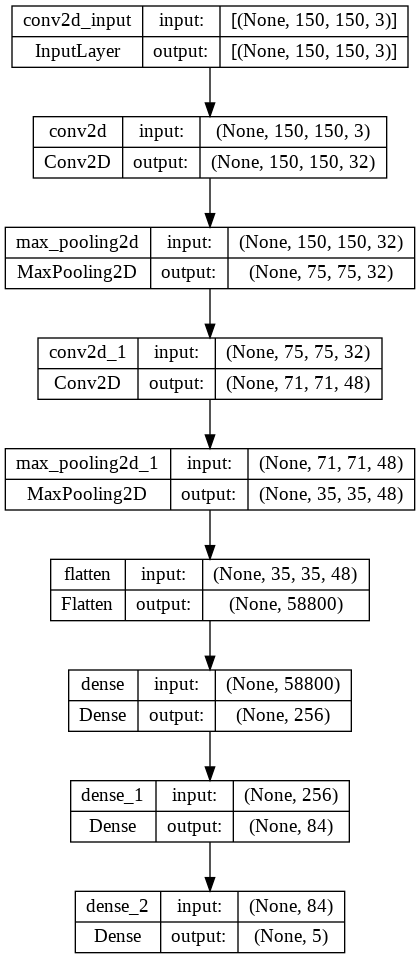

In [ ]:
plot_model(lenetmodel, show_shapes=True, show_layer_names=True)

In [ ]:
monitor_val_acc = EarlyStopping(monitor='accuracy', patience=5)
history = lenetmodel.fit_generator(generator=train_generator,
                    steps_per_epoch=train_generator.n//10, 
                    epochs=no_of_epochs, 
                    validation_data=test_generator, 
                    validation_steps=test_generator.n//10,
                    callbacks=[monitor_val_acc])

lenetmodel.save('insects_recgognition_model(LeNET).h5')
print("Saved model to disk")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  import sys


Epoch 1/50
77/77 [==============================] - 27s 225ms/step - loss: 1.5718 - accuracy: 0.2891 - val_loss: 1.4909 - val_accuracy: 0.4182
Epoch 2/50
77/77 [==============================] - 13s 167ms/step - loss: 1.4766 - accuracy: 0.3672 - val_loss: 1.4445 - val_accuracy: 0.4182
Epoch 3/50
77/77 [==============================] - 12s 162ms/step - loss: 1.4231 - accuracy: 0.4271 - val_loss: 1.3630 - val_accuracy: 0.4273
Epoch 4/50
77/77 [==============================] - 14s 178ms/step - loss: 1.3974 - accuracy: 0.4284 - val_loss: 1.5764 - val_accuracy: 0.3182
Epoch 5/50
77/77 [==============================] - 12s 160ms/step - loss: 1.3512 - accuracy: 0.4375 - val_loss: 1.2849 - val_accuracy: 0.4545
Epoch 6/50
77/77 [==============================] - 13s 163ms/step - loss: 1.3074 - accuracy: 0.4440 - val_loss: 1.3590 - val_accuracy: 0.4364
Epoch 7/50
77/77 [==============================] - 13s 175ms/step - loss: 1.3097 - accuracy: 0.4557 - val_loss: 1.2717 - val_accuracy: 0.4818

In [ ]:
score = lenetmodel.evaluate(test_generator, steps=test_generator.n//10, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1]*100)

Test loss: 0.9208182096481323
Test accuracy: 64.54545259475708


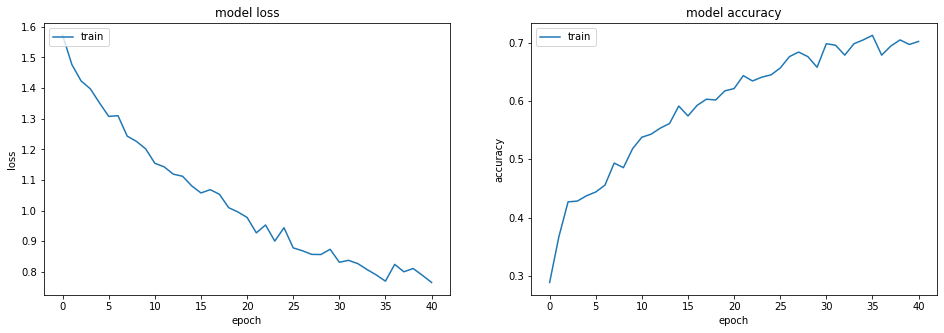

In [ ]:
plt.figure(figsize=(16,5))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

110/110 [==============================] - 2s 15ms/step


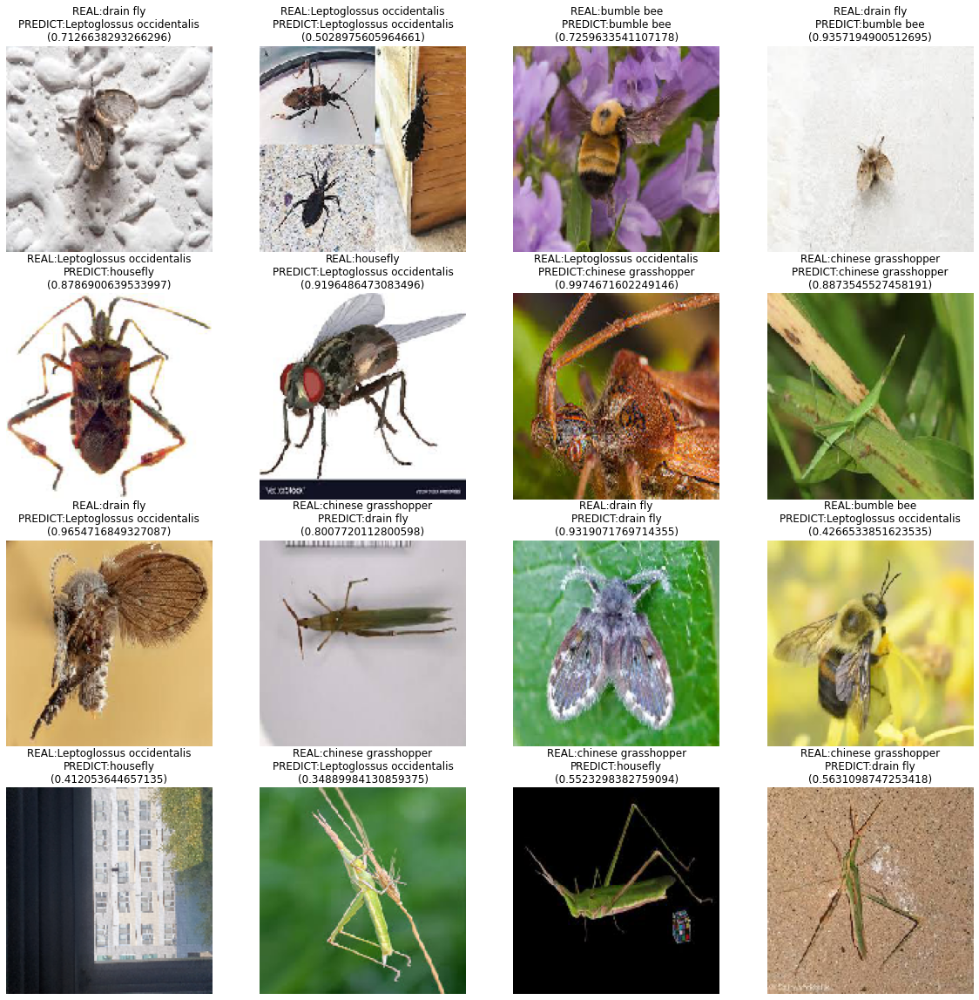

In [ ]:
predictions = lenetmodel.predict(pred_generator)

f,ax = plt.subplots(4,4,figsize=(20,20))

for i in range(16):
    image, label = pred_generator.next() 
    im_class = pred_generator.class_indices
    real_class = list(im_class.keys())[np.argmax(label)]
    ax[i//4,i%4].imshow(image[0])
    ax[i//4,i%4].axis('off')

    pred_class = list(im_class.keys())[np.argmax(predictions[i])]
    pred_prob = max(predictions[i]) 
    ax[i//4,i%4].set_title(f'REAL:{real_class}\nPREDICT:{pred_class}\n({pred_prob})')

In [ ]:
pre_lis = []
s = 0
for i in range(len(predictions)):
  image, answer_label = pred_generator.next()
  label = list(pred_generator.class_indices.keys())
  answer_label = label[np.argmax(answer_label)]
  a = np.argmax(predictions[i])
  pre_lis.append(label[a])
  if answer_label == pre_lis[i]:
    s+=1

print(len(predictions), s)
print(f"accuracy : {s/len(predictions)*100}%")

110 26
accuracy : 23.636363636363637%


# 3-2 모델 제작하기 (AlexNET)


In [ ]:
# create model(모델을 만듭니다)

alexnetmodel = Sequential() 
alexnetmodel.add(Conv2D(32, (3, 3), activation='relu', input_shape=img_size)) 
alexnetmodel.add(MaxPooling2D((2, 2))) 
alexnetmodel.add(Conv2D(64, (3, 3), activation='relu')) 
alexnetmodel.add(MaxPooling2D((2, 2))) 
alexnetmodel.add(Conv2D(128, (3, 3), activation='relu')) 
alexnetmodel.add(MaxPooling2D((2, 2))) 
alexnetmodel.add(Conv2D(128, (3, 3), activation='relu')) 
alexnetmodel.add(MaxPooling2D((2, 2))) 
alexnetmodel.add(Flatten()) 
alexnetmodel.add(Dropout(0.5)) 
alexnetmodel.add(Dense(512, activation='relu')) 
alexnetmodel.add(Dense(5, activation='softmax'))
alexnetmodel.compile(loss='binary_crossentropy', optimizer=RMSprop(lr=1e-4), metrics=['accuracy'])

alexnetmodel.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 74, 74, 32)       0         
 2D)                                                             
                                                                 
 conv2d_3 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 17, 17, 128)     

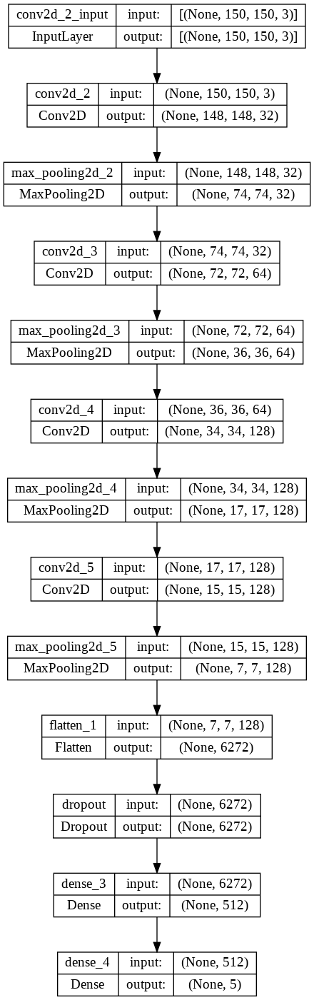

In [ ]:
plot_model(alexnetmodel, show_shapes=True, show_layer_names=True)

In [ ]:
monitor_val_acc = EarlyStopping(monitor='accuracy', patience=5)

history = alexnetmodel.fit_generator(generator=train_generator,
                    steps_per_epoch=train_generator.n//10, 
                    epochs=no_of_epochs, 
                    validation_data=test_generator, 
                    validation_steps=test_generator.n//10,
                    callbacks=[monitor_val_acc])

alexnetmodel.save('insects_recgognition_model(AlexNET).h5')
print("Saved model to disk")

Epoch 1/50


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  


77/77 [==============================] - 14s 167ms/step - loss: 0.5063 - accuracy: 0.2604 - val_loss: 0.4926 - val_accuracy: 0.2909
Epoch 2/50
77/77 [==============================] - 14s 180ms/step - loss: 0.4853 - accuracy: 0.3034 - val_loss: 0.4877 - val_accuracy: 0.3455
Epoch 3/50
77/77 [==============================] - 12s 161ms/step - loss: 0.4754 - accuracy: 0.3568 - val_loss: 0.4588 - val_accuracy: 0.4273
Epoch 4/50
77/77 [==============================] - 13s 162ms/step - loss: 0.4626 - accuracy: 0.3763 - val_loss: 0.4351 - val_accuracy: 0.4455
Epoch 5/50
77/77 [==============================] - 12s 162ms/step - loss: 0.4485 - accuracy: 0.4167 - val_loss: 0.4231 - val_accuracy: 0.4636
Epoch 6/50
77/77 [==============================] - 12s 160ms/step - loss: 0.4391 - accuracy: 0.4505 - val_loss: 0.4625 - val_accuracy: 0.4273
Epoch 7/50
77/77 [==============================] - 12s 158ms/step - loss: 0.4312 - accuracy: 0.4505 - val_loss: 0.4055 - val_accuracy: 0.4364
Epoch 8/50

In [ ]:
# model evaluate(모델을 평가해 봅니다)
score = alexnetmodel.evaluate(test_generator, steps=800//batch_size, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1]*100)

Test loss: 0.30565905570983887
Test accuracy: 64.54545259475708


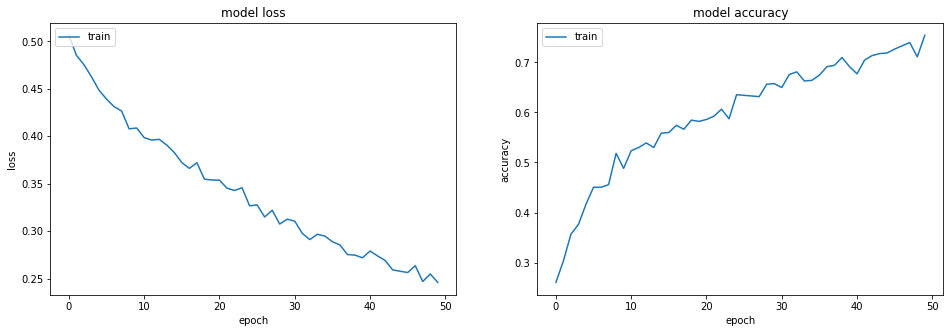

In [ ]:
plt.figure(figsize=(16,5))

# 만들어진 모델에 대해 train dataset과 validation dataset의 loss 를 그래프로 표현해 봅니다.
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

# 만들어진 모델에 대해 train dataset과 validation dataset의 accuracy 를 그래프로 표현해 봅니다.
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

In [ ]:
# pred_generator 가 만들어 내는 이미지의 클래스 인덱스가 무엇인지 확인해 본다.
print(pred_generator.class_indices)

{'Leptoglossus occidentalis': 0, 'bumble bee': 1, 'chinese grasshopper': 2, 'drain fly': 3, 'housefly': 4}


110/110 [==============================] - 2s 17ms/step


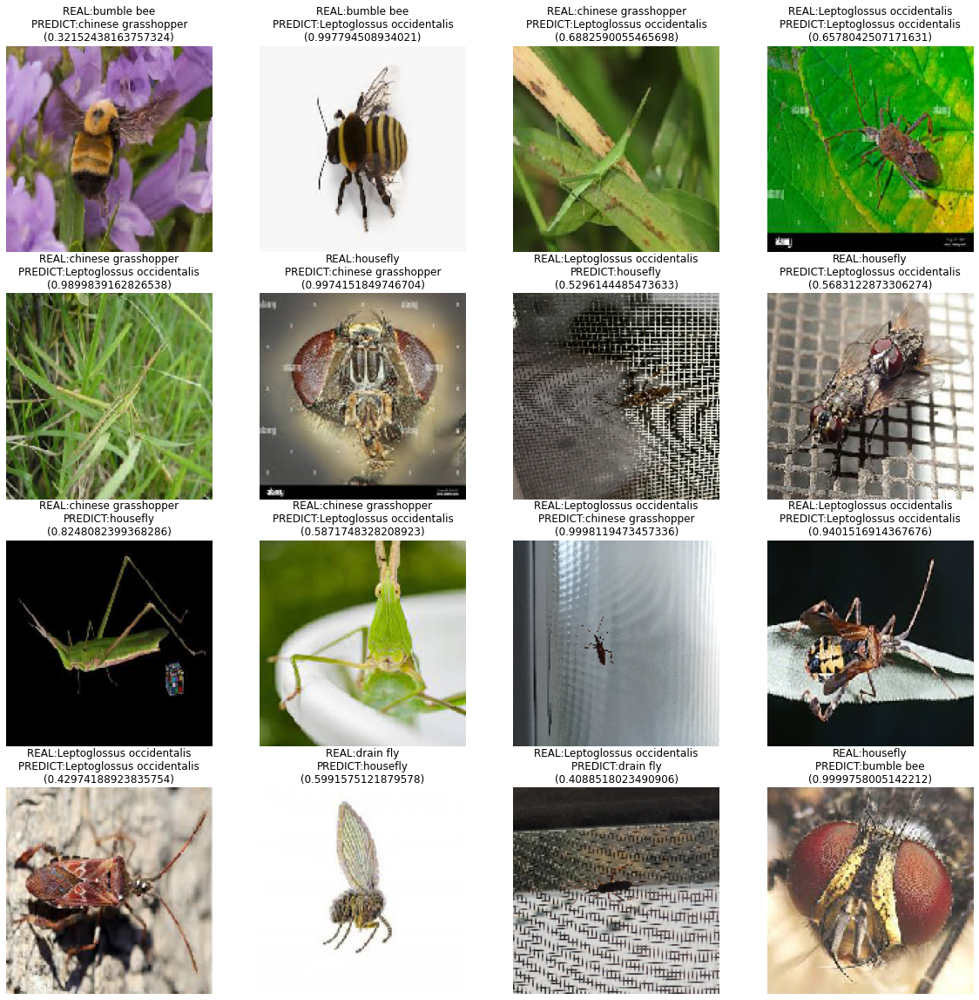

In [ ]:
predictions = alexnetmodel.predict(pred_generator)

f,ax = plt.subplots(4, 4, figsize=(20,20))

for i in range(16):
    image, label = pred_generator.next()               # pred_generator 가 만들어 낸 이미지를 하나씩 꺼내온다
    im_class = pred_generator.class_indices
    real_class = list(im_class.keys())[np.argmax(label)]
    ax[i//4,i%4].imshow(image[0])                      # pred_generator 가 만들어 낸 이미지를 보여줌
    ax[i//4,i%4].axis('off')

    pred_class = list(im_class.keys())[np.argmax(predictions[i])] # pred_generator 가 만들어 낸 이미지를 모델을 통해 예측한 결과 값의 label name
    pred_prob = max(predictions[i])                            # pred_generator 가 만들어 낸 이미지를 모델을 통해 예측한 결과(확률값)
    ax[i//4,i%4].set_title(f'REAL:{real_class}\nPREDICT:{pred_class}\n({pred_prob})')

In [ ]:
pre_lis = []
s = 0
for i in range(len(predictions)):
  image, answer_label = pred_generator.next()
  label = list(pred_generator.class_indices.keys())
  answer_label = label[np.argmax(answer_label)]
  a = np.argmax(predictions[i])
  pre_lis.append(label[a])
  if answer_label == pre_lis[i]:
    s+=1

print(len(predictions), s)
print(f"accuracy : {s/len(predictions)*100}%")

110 28
accuracy : 25.454545454545453%


# 3-3 모델 제작 (VGG16)

58889256/58889256 [==============================] - 2s 0us/step
Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 150, 150, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 150, 150, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 75, 75, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 75, 75, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 75, 75, 128)       147584    
                                                              

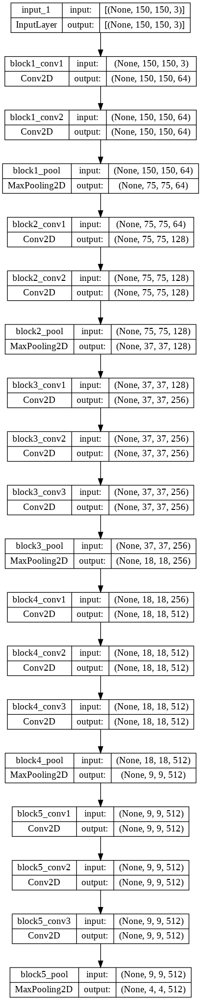

In [ ]:
# 사전 학습된 모델 불러오기
from keras.applications.vgg16 import VGG16

input_tensor = Input(shape=(150,150,3))
vgg16model = VGG16(weights='imagenet', include_top=False, input_tensor = input_tensor)

print(vgg16model.summary())
plot_model(vgg16model, show_shapes=True, show_layer_names=True)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 150, 150, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 150, 150, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 75, 75, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 75, 75, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 75, 75, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 37, 37, 128)       0     

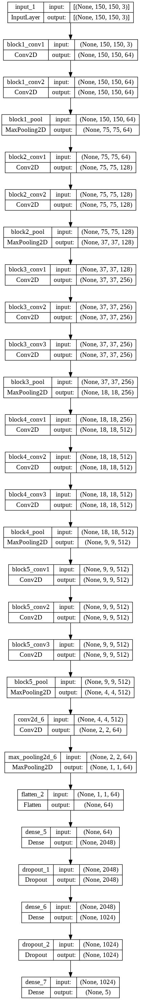

In [ ]:
layer_dict = dict([(layer.name, layer) for layer in vgg16model.layers])

x = layer_dict['block5_pool'].output
x = Conv2D(filters = 64, kernel_size=(3, 3), activation='relu')(x)
x = MaxPooling2D(pool_size=(2, 2))(x)
x = Flatten()(x)
x = Dense(2048, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(5, activation='softmax')(x)

vgg16_new_model = Model(inputs = vgg16model.input, outputs = x)

#######################################################################
# CNN Pre-trained 가중치를 그대로 사용할때
for layer in vgg16_new_model.layers[:19] :
    layer.trainable = False

# 컴파일 옵션
vgg16_new_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
vgg16_new_model.summary()
plot_model(vgg16_new_model, show_shapes=True, show_layer_names=True)

In [ ]:
monitor_val_acc = EarlyStopping(monitor='accuracy', patience=5)

history = vgg16_new_model.fit_generator(generator=train_generator,
                    steps_per_epoch=train_generator.n//10, 
                    epochs=no_of_epochs, 
                    validation_data=test_generator, 
                    validation_steps=test_generator.n//10,
                    callbacks=[monitor_val_acc])

vgg16_new_model.save('insects_recgognition_model(VGG16).h5')
print("Saved model to disk")

Epoch 1/50


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  


77/77 [==============================] - 16s 185ms/step - loss: 1.3766 - accuracy: 0.3919 - val_loss: 0.8616 - val_accuracy: 0.6182
Epoch 2/50
77/77 [==============================] - 15s 192ms/step - loss: 0.9224 - accuracy: 0.6484 - val_loss: 0.8597 - val_accuracy: 0.7182
Epoch 3/50
77/77 [==============================] - 13s 172ms/step - loss: 0.8192 - accuracy: 0.6992 - val_loss: 0.7204 - val_accuracy: 0.7545
Epoch 4/50
77/77 [==============================] - 13s 174ms/step - loss: 0.6665 - accuracy: 0.7578 - val_loss: 0.5238 - val_accuracy: 0.8273
Epoch 5/50
77/77 [==============================] - 13s 169ms/step - loss: 0.6246 - accuracy: 0.7656 - val_loss: 0.6126 - val_accuracy: 0.7909
Epoch 6/50
77/77 [==============================] - 13s 174ms/step - loss: 0.5438 - accuracy: 0.8151 - val_loss: 0.4898 - val_accuracy: 0.7909
Epoch 7/50
77/77 [==============================] - 13s 172ms/step - loss: 0.5303 - accuracy: 0.8164 - val_loss: 0.8849 - val_accuracy: 0.7273
Epoch 8/50

In [ ]:
score = vgg16_new_model.evaluate(test_generator, steps=test_generator.n//10, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1]*100)

Test loss: 0.37231361865997314
Test accuracy: 87.27272748947144


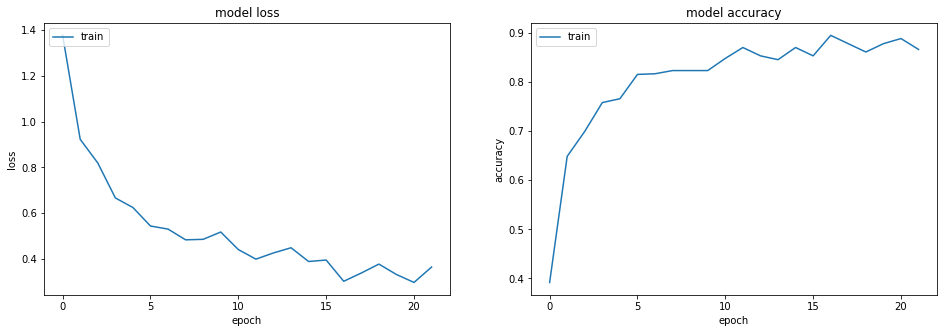

In [ ]:
plt.figure(figsize=(16,5))

# 만들어진 모델에 대해 train dataset과 validation dataset의 loss 를 그래프로 표현해 봅니다.
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

# 만들어진 모델에 대해 train dataset과 validation dataset의 accuracy 를 그래프로 표현해 봅니다.
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')


110/110 [==============================] - 3s 18ms/step


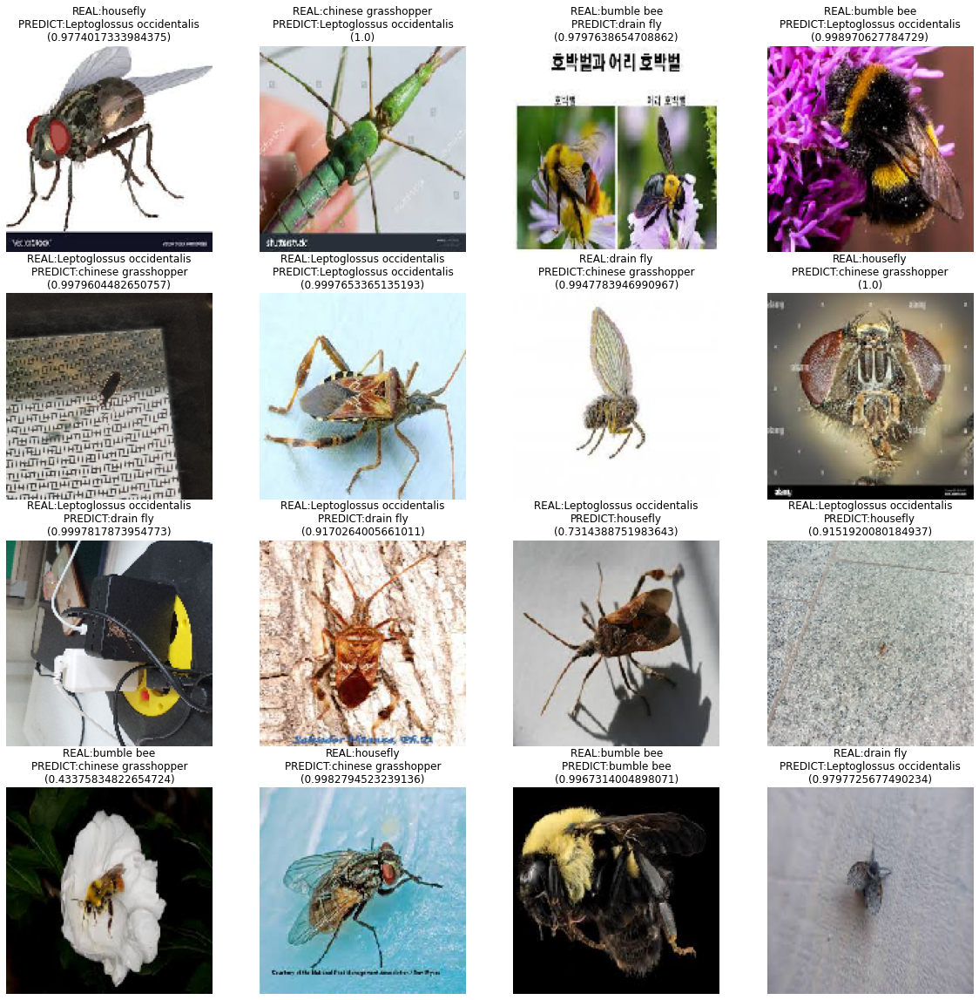

In [ ]:
predictions = vgg16_new_model.predict(pred_generator)

f,ax = plt.subplots(4, 4, figsize=(20,20))

for i in range(16):
    image, label = pred_generator.next()               # pred_generator 가 만들어 낸 이미지를 하나씩 꺼내온다
    im_class = pred_generator.class_indices
    real_class = list(im_class.keys())[np.argmax(label)]
    ax[i//4,i%4].imshow(image[0])                      # pred_generator 가 만들어 낸 이미지를 보여줌
    ax[i//4,i%4].axis('off')

    pred_class = list(im_class.keys())[np.argmax(predictions[i])] # pred_generator 가 만들어 낸 이미지를 모델을 통해 예측한 결과 값의 label name
    pred_prob = max(predictions[i])                            # pred_generator 가 만들어 낸 이미지를 모델을 통해 예측한 결과(확률값)
    ax[i//4,i%4].set_title(f'REAL:{real_class}\nPREDICT:{pred_class}\n({pred_prob})')

In [ ]:
pre_lis = []
s = 0
for i in range(len(predictions)):
  image, answer_label = pred_generator.next()
  label = list(pred_generator.class_indices.keys())
  answer_label = label[np.argmax(answer_label)]
  a = np.argmax(predictions[i])
  pre_lis.append(label[a])
  if answer_label == pre_lis[i]:
    s+=1

print(len(predictions), s)
print(f"accuracy : {s/len(predictions)*100}%")

110 26
accuracy : 23.636363636363637%


# 모델 설계하기 3-4 (Inception V1 - GoogLeNet)

In [ ]:
import keras
from keras.layers import concatenate, GlobalAveragePooling2D, AveragePooling2D

def inception_module(x,filters_1x1, filters_3x3_reduce,filters_3x3, filters_5x5_reduce, filters_5x5, filters_pool_proj, name=None):
    conv_1x1 = Conv2D(filters_1x1, (1, 1), padding='same', activation='relu', kernel_initializer=kernel_init, bias_initializer=bias_init)(x)
    conv_3x3 = Conv2D(filters_3x3_reduce, (1, 1), padding='same', activation='relu', kernel_initializer=kernel_init, bias_initializer=bias_init)(x)
    conv_3x3 = Conv2D(filters_3x3, (3, 3), padding='same', activation='relu', kernel_initializer=kernel_init, bias_initializer=bias_init)(conv_3x3)
    conv_5x5 = Conv2D(filters_5x5_reduce, (1, 1), padding='same', activation='relu', kernel_initializer=kernel_init, bias_initializer=bias_init)(x)
    conv_5x5 = Conv2D(filters_5x5, (5, 5), padding='same', activation='relu', kernel_initializer=kernel_init, bias_initializer=bias_init)(conv_5x5)
    pool_proj = MaxPooling2D((3, 3), strides=(1, 1), padding='same')(x)
    pool_proj = Conv2D(filters_pool_proj, (1, 1), padding='same', activation='relu', kernel_initializer=kernel_init, bias_initializer=bias_init)(pool_proj)
    output = concatenate([conv_1x1, conv_3x3, conv_5x5, pool_proj], axis=3, name=name)
    
    return output

kernel_init = keras.initializers.glorot_uniform()
bias_init = keras.initializers.Constant(value=0.2)

In [ ]:
input_layer = Input(shape = img_size)

x = Conv2D(64, (7, 7), padding = 'same', strides = (2, 2), activation='relu', name='conv_1_7x7/2', kernel_initializer = kernel_init, bias_initializer = bias_init)(input_layer)
x = MaxPooling2D((3, 3), padding ='same', strides=(2, 2), name='max_pool_1_3x3/2')(x)
x = Conv2D(64, (1, 1), padding='same', strides=(1, 1), activation='relu', name='conv_2a_3x3/1')(x)
x = Conv2D(192, (3, 3), padding='same', strides=(1, 1), activation='relu', name='conv_2b_3x3/1')(x)
x = MaxPooling2D((3, 3), padding='same', strides=(2, 2), name='max_pool_2_3x3/2')(x)
x = inception_module(x, filters_1x1=64, filters_3x3_reduce=96, filters_3x3=128, filters_5x5_reduce=16, filters_5x5=32,filters_pool_proj=32, name='inception_3a')
x = inception_module(x, filters_1x1=128, filters_3x3_reduce=128, filters_3x3=192,filters_5x5_reduce=32, filters_5x5=96, filters_pool_proj=64, name='inception_3b')
x = MaxPooling2D((3, 3), padding='same', strides=(2, 2), name='max_pool_3_3x3/2')(x)
x = inception_module(x, filters_1x1=192, filters_3x3_reduce=96, filters_3x3=208, filters_5x5_reduce=16, filters_5x5=48, filters_pool_proj=64, name='inception_4a')
x1 = AveragePooling2D((5, 5), strides=3)(x)
x1 = Conv2D(128, (1, 1), padding='same', activation='relu')(x1)
x1 = Flatten()(x1)
x1 = Dense(1024, activation='relu')(x1)
x1 = Dropout(0.7)(x1)
x1 = Dense(5, activation='softmax', name='auxilliary_output_1')(x1)
x = inception_module(x,filters_1x1=160,filters_3x3_reduce=112,filters_3x3=224,filters_5x5_reduce=24,filters_5x5=64,filters_pool_proj=64,name='inception_4b')
x = inception_module(x,filters_1x1=128,filters_3x3_reduce=128, filters_3x3=256,filters_5x5_reduce=24,filters_5x5=64, filters_pool_proj=64,name='inception_4c')
x = inception_module(x,filters_1x1=112,filters_3x3_reduce=144, filters_3x3=288,filters_5x5_reduce=32,filters_5x5=64, filters_pool_proj=64, name='inception_4d')
x2 = AveragePooling2D((5, 5), strides=3)(x)
x2 = Conv2D(128, (1, 1), padding='same', activation='relu')(x2)
x2 = Flatten()(x2)
x2 = Dense(1024, activation='relu')(x2)
x2 = Dropout(0.7)(x2)
x2 = Dense(5, activation='softmax', name='auxilliary_output_2')(x2)
x = inception_module(x,filters_1x1=256,filters_3x3_reduce=160, filters_3x3=320,filters_5x5_reduce=32,filters_5x5=128, filters_pool_proj=128, name='inception_4e')
x = MaxPooling2D((3, 3), padding='same', strides=(2, 2), name='max_pool_4_3x3/2')(x)
x = inception_module(x,filters_1x1=256,filters_3x3_reduce=160, filters_3x3=320,filters_5x5_reduce=32,filters_5x5=128, filters_pool_proj=128, name='inception_5a')
x = inception_module(x, filters_1x1=384,filters_3x3_reduce=192, filters_3x3=384,filters_5x5_reduce=48,filters_5x5=128, filters_pool_proj=128, name='inception_5b')
x = GlobalAveragePooling2D(name='avg_pool_5_3x3/1')(x)
x = Dropout(0.4)(x)
x = Dense(5, activation='softmax', name='output')(x)
model = Model(input_layer, [x, x1, x2], name='inception_v1')

In [ ]:
model.summary()

Model: "inception_v1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 150, 150, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv_1_7x7/2 (Conv2D)          (None, 75, 75, 64)   9472        ['input_2[0][0]']                
                                                                                                  
 max_pool_1_3x3/2 (MaxPooling2D  (None, 38, 38, 64)  0           ['conv_1_7x7/2[0][0]']           
 )                                                                                                
                                                                                       

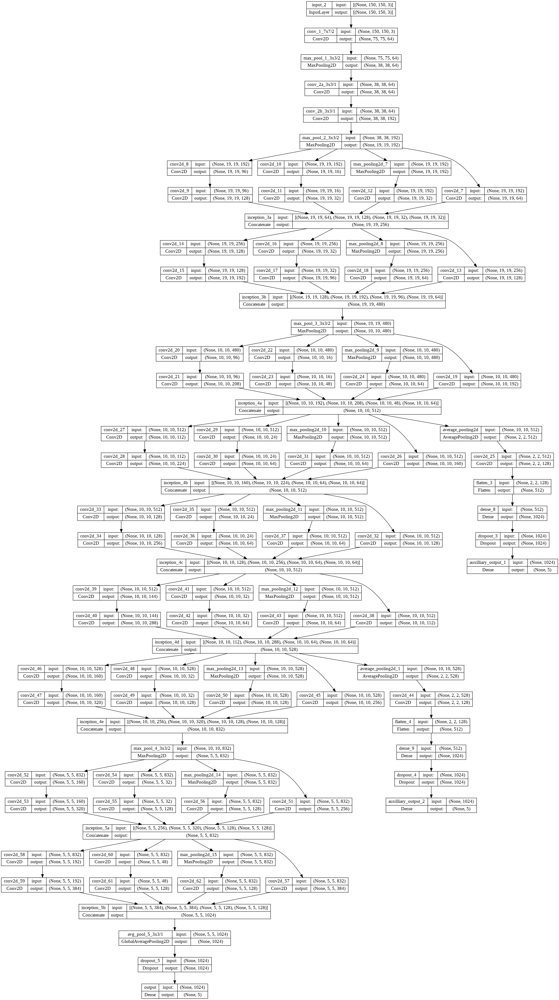

In [ ]:
plot_model(model, show_shapes=True, show_layer_names=True)

In [ ]:
from keras.optimizers import SGD 
from keras.callbacks import LearningRateScheduler
import math

initial_lrate = 0.01

def decay(epoch, steps=100):
    initial_lrate = 0.01
    drop = 0.96
    epochs_drop = 8
    lrate = initial_lrate * math.pow(drop, math.floor((1+epoch)/epochs_drop))
    return lrate

sgd = SGD(lr=initial_lrate, momentum=0.9, nesterov=False)
lr_sc = LearningRateScheduler(decay, verbose=1)
model.compile(loss=['categorical_crossentropy', 'categorical_crossentropy', 'categorical_crossentropy'], loss_weights=[1, 0.3, 0.3], optimizer=sgd, metrics=['accuracy'])

/usr/local/lib/python3.7/dist-packages/keras/optimizers/optimizer_v2/gradient_descent.py:108: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(SGD, self).__init__(name, **kwargs)


In [ ]:
history = model.fit_generator(generator=train_generator,
                    steps_per_epoch=train_generator.n//10, 
                    epochs=no_of_epochs, 
                    validation_data=test_generator, 
                    validation_steps=test_generator.n//10,
                    callbacks=[lr_sc])


Epoch 1: LearningRateScheduler setting learning rate to 0.01.
Epoch 1/50


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  


77/77 [==============================] - 21s 202ms/step - loss: 2.8348 - output_loss: 1.8500 - auxilliary_output_1_loss: 1.6501 - auxilliary_output_2_loss: 1.6327 - output_accuracy: 0.2305 - auxilliary_output_1_accuracy: 0.2214 - auxilliary_output_2_accuracy: 0.2279 - val_loss: 2.5640 - val_output_loss: 1.6128 - val_auxilliary_output_1_loss: 1.5845 - val_auxilliary_output_2_loss: 1.5862 - val_output_accuracy: 0.2000 - val_auxilliary_output_1_accuracy: 0.2909 - val_auxilliary_output_2_accuracy: 0.2909 - lr: 0.0100

Epoch 2: LearningRateScheduler setting learning rate to 0.01.
Epoch 2/50
77/77 [==============================] - 14s 174ms/step - loss: 2.6138 - output_loss: 1.6547 - auxilliary_output_1_loss: 1.5959 - auxilliary_output_2_loss: 1.6010 - output_accuracy: 0.2409 - auxilliary_output_1_accuracy: 0.2773 - auxilliary_output_2_accuracy: 0.2799 - val_loss: 2.5462 - val_output_loss: 1.5947 - val_auxilliary_output_1_loss: 1.5845 - val_auxilliary_output_2_loss: 1.5872 - val_output_accu

In [ ]:
model.save('insects_recgognition_model(Inception V1).h5')
print("Saved model to disk")

Saved model to disk


In [ ]:
score = model.evaluate(test_generator, steps=test_generator.n//10, verbose=0)
print('Test loss:', score[0:4])
print('Test accuracy:', score[4:7])

Test loss: [1.8270267248153687, 1.1402422189712524, 1.128511667251587, 1.1607698202133179]
Test accuracy: [0.4909090995788574, 0.5181818008422852, 0.5363636612892151]


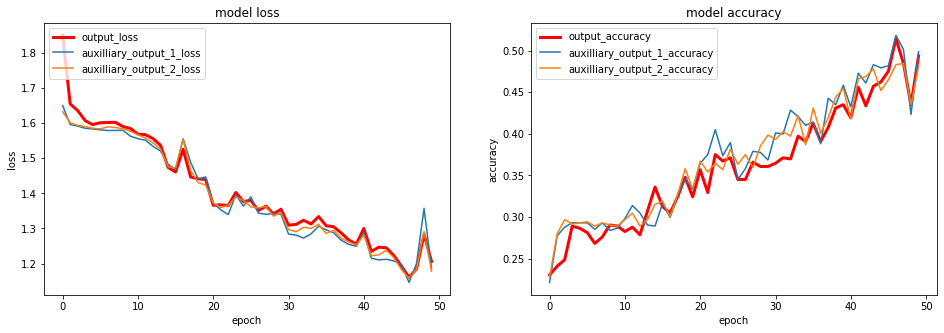

In [ ]:
plt.figure(figsize=(16,5))

# 만들어진 모델에 대해 train dataset과 validation dataset의 loss 를 그래프로 표현해 봅니다.
plt.subplot(1, 2, 1)
plt.plot(history.history['output_loss'], linewidth = 3, color = "red")
plt.plot(history.history['auxilliary_output_1_loss'])
plt.plot(history.history['auxilliary_output_2_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['output_loss','auxilliary_output_1_loss','auxilliary_output_2_loss'], loc='upper left')

# 만들어진 모델에 대해 train dataset과 validation dataset의 accuracy 를 그래프로 표현해 봅니다.
plt.subplot(1, 2, 2)
plt.plot(history.history['output_accuracy'], linewidth = 3, color = "red")
plt.plot(history.history['auxilliary_output_1_accuracy'])
plt.plot(history.history['auxilliary_output_2_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['output_accuracy', 'auxilliary_output_1_accuracy','auxilliary_output_2_accuracy'], loc='upper left')


110/110 [==============================] - 2s 20ms/step


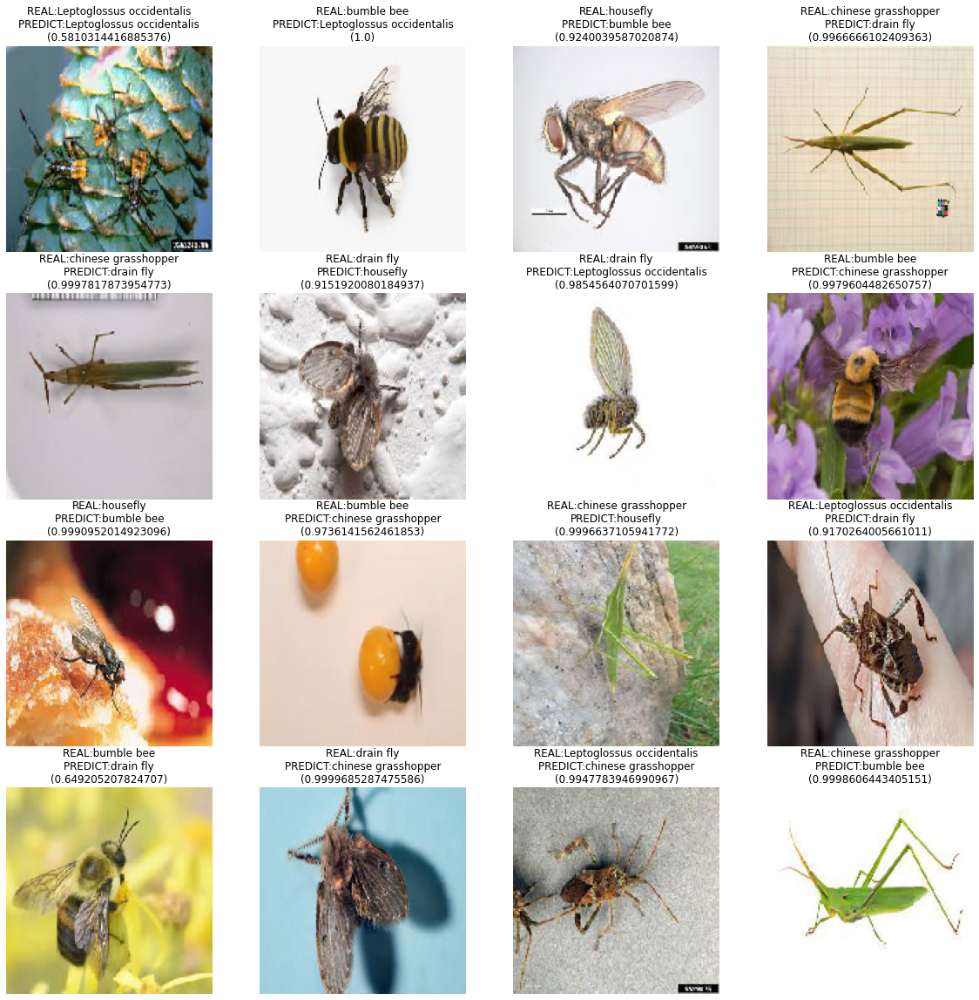

In [ ]:
predictions = vgg16_new_model.predict(pred_generator)

f,ax = plt.subplots(4, 4, figsize=(20,20))

for i in range(16):
    image, label = pred_generator.next()               # pred_generator 가 만들어 낸 이미지를 하나씩 꺼내온다
    im_class = pred_generator.class_indices
    real_class = list(im_class.keys())[np.argmax(label)]
    ax[i//4,i%4].imshow(image[0])                      # pred_generator 가 만들어 낸 이미지를 보여줌
    ax[i//4,i%4].axis('off')

    pred_class = list(im_class.keys())[np.argmax(predictions[i])] # pred_generator 가 만들어 낸 이미지를 모델을 통해 예측한 결과 값의 label name
    pred_prob = max(predictions[i])                            # pred_generator 가 만들어 낸 이미지를 모델을 통해 예측한 결과(확률값)
    ax[i//4,i%4].set_title(f'REAL:{real_class}\nPREDICT:{pred_class}\n({pred_prob})')

In [ ]:
pre_lis = []
s = 0
for i in range(len(predictions)):
  image, answer_label = pred_generator.next()
  label = list(pred_generator.class_indices.keys())
  answer_label = label[np.argmax(answer_label)]
  a = np.argmax(predictions[i])
  pre_lis.append(label[a])
  if answer_label == pre_lis[i]:
    s+=1

print(len(predictions), s)
print(f"accuracy : {s/len(predictions)*100}%")

110 16
accuracy : 14.545454545454545%


# Inception V4

In [ ]:
import numpy as np

# Sys
import warnings
# Keras Core
from keras.layers.convolutional import MaxPooling2D, Convolution2D, AveragePooling2D
from keras.layers import Input, Dropout, Dense, Flatten, Activation
from tensorflow.keras.layers import BatchNormalization
from keras.layers import concatenate
from keras import regularizers
from keras import initializers
from keras.models import Model
# Backend
from keras import backend as K
# Utils
from keras.utils.data_utils import get_file

WEIGHTS_PATH = 'https://github.com/kentsommer/keras-inceptionV4/releases/download/2.1/inception-v4_weights_tf_dim_ordering_tf_kernels.h5'
WEIGHTS_PATH_NO_TOP = 'https://github.com/kentsommer/keras-inceptionV4/releases/download/2.1/inception-v4_weights_tf_dim_ordering_tf_kernels_notop.h5'

def preprocess_input(x):
    x = np.divide(x, 255.0)
    x = np.subtract(x, 0.5)
    x = np.multiply(x, 2.0)
    return x

In [ ]:
def conv2d_bn(x, nb_filter, num_row, num_col, padding='same', strides=(1, 1), use_bias=False):
    if K.image_data_format() == 'channels_first':
        channel_axis = 1
    else:
        channel_axis = -1
    x = Convolution2D(nb_filter, (num_row, num_col),
                      strides=strides,
                      padding=padding,
                      use_bias=use_bias,
                      kernel_regularizer=regularizers.l2(0.00004),
                      kernel_initializer=initializers.VarianceScaling(scale=2.0, mode='fan_in', distribution='normal', seed=None))(x)
    x = BatchNormalization(axis=channel_axis, momentum=0.9997, scale=False)(x)
    x = Activation('relu')(x)
    return x

def block_inception_a(input):
    if K.image_data_format() == 'channels_first':
        channel_axis = 1
    else:
        channel_axis = -1

    branch_0 = conv2d_bn(input, 96, 1, 1)

    branch_1 = conv2d_bn(input, 64, 1, 1)
    branch_1 = conv2d_bn(branch_1, 96, 3, 3)

    branch_2 = conv2d_bn(input, 64, 1, 1)
    branch_2 = conv2d_bn(branch_2, 96, 3, 3)
    branch_2 = conv2d_bn(branch_2, 96, 3, 3)

    branch_3 = AveragePooling2D((3,3), strides=(1,1), padding='same')(input)
    branch_3 = conv2d_bn(branch_3, 96, 1, 1)

    x = concatenate([branch_0, branch_1, branch_2, branch_3], axis=channel_axis)
    return x

def block_reduction_a(input):
    if K.image_data_format() == 'channels_first':
        channel_axis = 1
    else:
        channel_axis = -1

    branch_0 = conv2d_bn(input, 384, 3, 3, strides=(2,2), padding='valid')

    branch_1 = conv2d_bn(input, 192, 1, 1)
    branch_1 = conv2d_bn(branch_1, 224, 3, 3)
    branch_1 = conv2d_bn(branch_1, 256, 3, 3, strides=(2,2), padding='valid')

    branch_2 = MaxPooling2D((3,3), strides=(2,2), padding='valid')(input)

    x = concatenate([branch_0, branch_1, branch_2], axis=channel_axis)
    return x

def block_inception_b(input):
    if K.image_data_format() == 'channels_first':
        channel_axis = 1
    else:
        channel_axis = -1

    branch_0 = conv2d_bn(input, 384, 1, 1)

    branch_1 = conv2d_bn(input, 192, 1, 1)
    branch_1 = conv2d_bn(branch_1, 224, 1, 7)
    branch_1 = conv2d_bn(branch_1, 256, 7, 1)

    branch_2 = conv2d_bn(input, 192, 1, 1)
    branch_2 = conv2d_bn(branch_2, 192, 7, 1)
    branch_2 = conv2d_bn(branch_2, 224, 1, 7)
    branch_2 = conv2d_bn(branch_2, 224, 7, 1)
    branch_2 = conv2d_bn(branch_2, 256, 1, 7)

    branch_3 = AveragePooling2D((3,3), strides=(1,1), padding='same')(input)
    branch_3 = conv2d_bn(branch_3, 128, 1, 1)

    x = concatenate([branch_0, branch_1, branch_2, branch_3], axis=channel_axis)
    return x

def block_reduction_b(input):
    if K.image_data_format() == 'channels_first':
        channel_axis = 1
    else:
        channel_axis = -1

    branch_0 = conv2d_bn(input, 192, 1, 1)
    branch_0 = conv2d_bn(branch_0, 192, 3, 3, strides=(2, 2), padding='valid')

    branch_1 = conv2d_bn(input, 256, 1, 1)
    branch_1 = conv2d_bn(branch_1, 256, 1, 7)
    branch_1 = conv2d_bn(branch_1, 320, 7, 1)
    branch_1 = conv2d_bn(branch_1, 320, 3, 3, strides=(2,2), padding='valid')

    branch_2 = MaxPooling2D((3, 3), strides=(2, 2), padding='valid')(input)

    x = concatenate([branch_0, branch_1, branch_2], axis=channel_axis)
    return x

def block_inception_c(input):
    if K.image_data_format() == 'channels_first':
        channel_axis = 1
    else:
        channel_axis = -1

    branch_0 = conv2d_bn(input, 256, 1, 1)

    branch_1 = conv2d_bn(input, 384, 1, 1)
    branch_10 = conv2d_bn(branch_1, 256, 1, 3)
    branch_11 = conv2d_bn(branch_1, 256, 3, 1)
    branch_1 = concatenate([branch_10, branch_11], axis=channel_axis)


    branch_2 = conv2d_bn(input, 384, 1, 1)
    branch_2 = conv2d_bn(branch_2, 448, 3, 1)
    branch_2 = conv2d_bn(branch_2, 512, 1, 3)
    branch_20 = conv2d_bn(branch_2, 256, 1, 3)
    branch_21 = conv2d_bn(branch_2, 256, 3, 1)
    branch_2 = concatenate([branch_20, branch_21], axis=channel_axis)

    branch_3 = AveragePooling2D((3, 3), strides=(1, 1), padding='same')(input)
    branch_3 = conv2d_bn(branch_3, 256, 1, 1)

    x = concatenate([branch_0, branch_1, branch_2, branch_3], axis=channel_axis)
    return x

In [ ]:
def inception_v4_base(input):
    if K.image_data_format() == 'channels_first': channel_axis = 1
    else: channel_axis = -1

    net = conv2d_bn(input, 32, 3, 3, strides=(2,2), padding='valid')
    net = conv2d_bn(net, 32, 3, 3, padding='valid')
    net = conv2d_bn(net, 64, 3, 3)

    branch_0 = MaxPooling2D((3,3), strides=(2,2), padding='valid')(net)

    branch_1 = conv2d_bn(net, 96, 3, 3, strides=(2,2), padding='valid')

    net = concatenate([branch_0, branch_1], axis=channel_axis)

    branch_0 = conv2d_bn(net, 64, 1, 1)
    branch_0 = conv2d_bn(branch_0, 96, 3, 3, padding='valid')

    branch_1 = conv2d_bn(net, 64, 1, 1)
    branch_1 = conv2d_bn(branch_1, 64, 1, 7)
    branch_1 = conv2d_bn(branch_1, 64, 7, 1)
    branch_1 = conv2d_bn(branch_1, 96, 3, 3, padding='valid')

    net = concatenate([branch_0, branch_1], axis=channel_axis)

    branch_0 = conv2d_bn(net, 192, 3, 3, strides=(2,2), padding='valid')
    branch_1 = MaxPooling2D((3,3), strides=(2,2), padding='valid')(net)

    net = concatenate([branch_0, branch_1], axis=channel_axis)

    # 35 x 35 x 384
    # 4 x Inception-A blocks
    for idx in range(4):
    	net = block_inception_a(net)

    # 35 x 35 x 384
    # Reduction-A block
    net = block_reduction_a(net)

    # 17 x 17 x 1024
    # 7 x Inception-B blocks
    for idx in range(7):
    	net = block_inception_b(net)

    # 17 x 17 x 1024
    # Reduction-B block
    net = block_reduction_b(net)

    # 8 x 8 x 1536
    # 3 x Inception-C blocks
    for idx in range(3):
    	net = block_inception_c(net)

    return net

def inception_v4(num_classes, dropout_keep_prob, weights, include_top):
    '''
    Creates the inception v4 network
    Args:
    	num_classes: number of classes
    	dropout_keep_prob: float, the fraction to keep before final layer.
    
    Returns: 
    	logits: the logits outputs of the model.
    '''

    # Input Shape is 299 x 299 x 3 (tf) or 3 x 299 x 299 (th)
    if K.image_data_format() == 'channels_first':
        inputs = Input((3, 299, 299))
    else:
        inputs = Input((299, 299, 3))

    # Make inception base
    x = inception_v4_base(inputs)


    # Final pooling and prediction
    if include_top:
        # 1 x 1 x 1536
        x = AveragePooling2D((8,8), padding='valid')(x)
        x = Dropout(dropout_keep_prob)(x)
        x = Flatten()(x)
        # 1536
        x = Dense(units=num_classes, activation='softmax')(x)

    model = Model(inputs, x, name='inception_v4')

    # load weights
    if weights == 'imagenet':
        if K.image_data_format() == 'channels_first':
            if K.backend() == 'tensorflow':
                warnings.warn('You are using the TensorFlow backend, yet you '
                              'are using the Theano '
                              'image data format convention '
                              '(`image_data_format="channels_first"`). '
                              'For best performance, set '
                              '`image_data_format="channels_last"` in '
                              'your Keras config '
                              'at ~/.keras/keras.json.')
        if include_top:
            weights_path = get_file(
                'inception-v4_weights_tf_dim_ordering_tf_kernels.h5',
                WEIGHTS_PATH,
                cache_subdir='models',
                md5_hash='9fe79d77f793fe874470d84ca6ba4a3b')
        else:
            weights_path = get_file(
                'inception-v4_weights_tf_dim_ordering_tf_kernels_notop.h5',
                WEIGHTS_PATH_NO_TOP,
                cache_subdir='models',
                md5_hash='9296b46b5971573064d12e4669110969')
        model.load_weights(weights_path, by_name=True)
    return model


def create_model(num_classes=1001, dropout_prob=0.2, weights=None, include_top=True):
    return inception_v4(num_classes, dropout_prob, weights, include_top)

In [ ]:
from keras import backend as K
import numpy as np
import cv2
import os

os.environ['CUDA_VISIBLE_DEVICES'] = ''

# This function comes from Google's ImageNet Preprocessing Script
def central_crop(image, central_fraction):
	if central_fraction <= 0.0 or central_fraction > 1.0:
		raise ValueError('central_fraction must be within (0, 1]')
	if central_fraction == 1.0:
		return image

	img_shape = image.shape
	depth = img_shape[2]
	fraction_offset = int(1 / ((1 - central_fraction) / 2.0))
	bbox_h_start = int(np.divide(img_shape[0], fraction_offset))
	bbox_w_start = int(np.divide(img_shape[1], fraction_offset))

	bbox_h_size = int(img_shape[0] - bbox_h_start * 2)
	bbox_w_size = int(img_shape[1] - bbox_w_start * 2)

	image = image[bbox_h_start:bbox_h_start+bbox_h_size, bbox_w_start:bbox_w_start+bbox_w_size]
	return image


def get_processed_image(img_path):
	# Load image and convert from BGR to RGB
	im = np.asarray(cv2.imread(img_path))[:,:,::-1]
	im = central_crop(im, 0.875)
	im = cv2.resize(im, (299, 299))
	im = preprocess_input(im)
	if K.image_data_format() == "channels_first":
		im = np.transpose(im, (2,0,1))
		im = im.reshape(-1,3,299,299)
	else:
		im = im.reshape(-1,299,299,3)
	return im

In [ ]:
model = create_model(weights='imagenet', include_top=True)

# Open Class labels dictionary. (human readable label given ID)
classes = eval(open('/content/class_names.txt', 'r').read())

# Load test image!
img = get_processed_image("/content/elephant.jpg")

# Run prediction on test image
preds = model.predict(img)
print("Class is: " + classes[np.argmax(preds)-1])
print("Certainty is: " + str(preds[0][np.argmax(preds)]))

171941772/171941772 [==============================] - 14s 0us/step


ValueError: ignored

In [ ]:
model = create_model(weights='imagenet', include_top=True)

In [ ]:
model.summary()

In [ ]:
plot_model(model, show_shapes=True, show_layer_names=True)